Visualizing Big Data with Datashader:
Datashader is a graphics pipeline system for creating meaningful 
representations of large datasets quickly and flexibly. 
Datashader breaks the creation of images into a series of 
explicit steps that allow computations to be done on intermediate representations. 

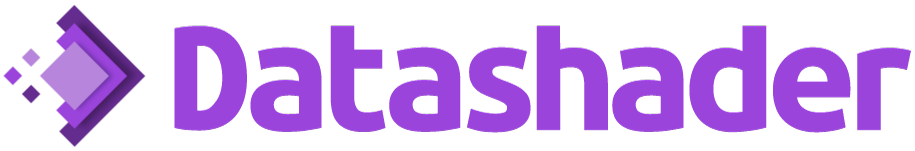

In [37]:
from IPython.display import Image
Image(filename='logo_horizontal.png',height=500,width=500)

In [38]:
import datashader as ds
import pandas as pd
from colorcet import fire
from datashader import transfer_functions as tf

Load NYC Taxi data

In [61]:
df4=pd.read_csv('../Downloads/nyc_taxi11.csv',usecols= \
               ['pickup_x', 'pickup_y', 'dropoff_x','dropoff_y', 'passenger_count','tpep_pickup_datetime'])
df4.head()

,tpep_pickup_datetime,passenger_count,pickup_x,pickup_y,dropoff_x,dropoff_y
0,2015-01-01 20:20:57,1,-8.232723e+06,4.979400e+06,-8.235438e+06,4.973928e+06
1,2015-01-15 12:35:56,1,-8.233768e+06,4.979199e+06,-8.236276e+06,4.974675e+06
2,2015-01-02 22:02:55,1,-8.236912e+06,4.972484e+06,-8.235815e+06,4.972018e+06
3,2015-01-19 09:47:07,2,-8.232874e+06,4.979104e+06,-8.231489e+06,4.979778e+06
4,2015-01-09 17:32:26,5,-8.236896e+06,4.976339e+06,-8.235296e+06,4.972574e+06


Bokeh is an interactive visualization library for modern web browsers. 
It provides elegant, concise construction of versatile graphics, 
and affords high-performance interactivity over large or streaming datasets. 
Bokeh can help anyone who would like to quickly and easily make interactive plots, 
dashboards, and data applications.

In [40]:
from bokeh.models import BoxZoomTool

In [41]:
from bokeh.plotting import figure, output_notebook, show

In [42]:
output_notebook()

# Define general parameters for the Bokeh plot
NYC = x_range, y_range = ((-8242000,-8210000), (4965000,4990000))

plot_width  = int(990)
plot_height = int(plot_width//1.2)

options = dict(line_color=None, fill_color='blue', size=5)

Loading BokehJS ...

In [43]:
def base_plot(tools='pan,wheel_zoom,reset', plot_width=plot_width, plot_height=plot_height, **plot_kwargs):
    p = figure(tools=tools, plot_width=plot_width, plot_height=plot_height,
        x_range=x_range, y_range=y_range, outline_line_color=None,
        min_border=0, min_border_left=0, min_border_right=0,
        min_border_top=0, min_border_bottom=0, **plot_kwargs)
    
    p.axis.visible = False
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    
    p.add_tools(BoxZoomTool(match_aspect=True))
    
    return p


1000 data Samples:

In [44]:
from bokeh.tile_providers import STAMEN_TERRAIN
samples = df4.sample(n=1000)
p = base_plot()
p.add_tile(STAMEN_TERRAIN)
p.circle(x=samples['dropoff_x'], y=samples['dropoff_y'], **options)
show(p)

10000 data samples

In [45]:
samples = df4.sample(n=10000)
p = base_plot()
p.add_tile(STAMEN_TERRAIN)
p.circle(x=samples['dropoff_x'], y=samples['dropoff_y'], **options)
show(p)


100000 sample datapoints

In [46]:
options = dict(line_color=None, fill_color='blue', size=1, alpha=0.1)
samples = df4.sample(n=100000,replace=True)
p = base_plot()
p.add_tile(STAMEN_TERRAIN)
p.circle(x=samples['dropoff_x'], y=samples['dropoff_y'], **options)
show(p)
%time base_plot()

CPU times: user 2.32 ms, sys: 156 µs, total: 2.48 ms
Wall time: 2.48 ms


Figure(id='2890', ...)

Datashader

In [47]:
import datashader as ds
from datashader import transfer_functions as tf
from datashader.colors import Greys9
Greys9_r = list(reversed(Greys9))[:-2]


10-million-point Datashaded Plots: Auto-ranging, but Limited Dynamic Range

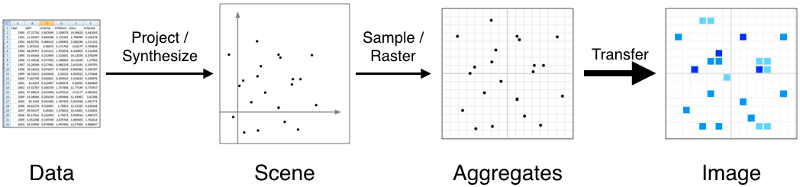

In [48]:
from IPython.display import Image
Image(filename='pipeline.png',height=500,width=500)

The steps involved in datashading are:

    1) create a Canvas object with the shape of the eventual plot (i.e. having one storage bin for collecting points, per final pixel)
    2) aggregating all points into that set of bins, incrementally counting them
    3) mapping the resulting counts into a visible color from a specified range to make an image


In [49]:
cvs = ds.Canvas(plot_width=plot_width, plot_height=plot_height, x_range=x_range, y_range=y_range)
agg = cvs.points(df4, 'dropoff_x', 'dropoff_y',  ds.count('passenger_count'))
img = tf.shade(agg, cmap=["green", 'darkblue'], how='linear')

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 6.91 µs


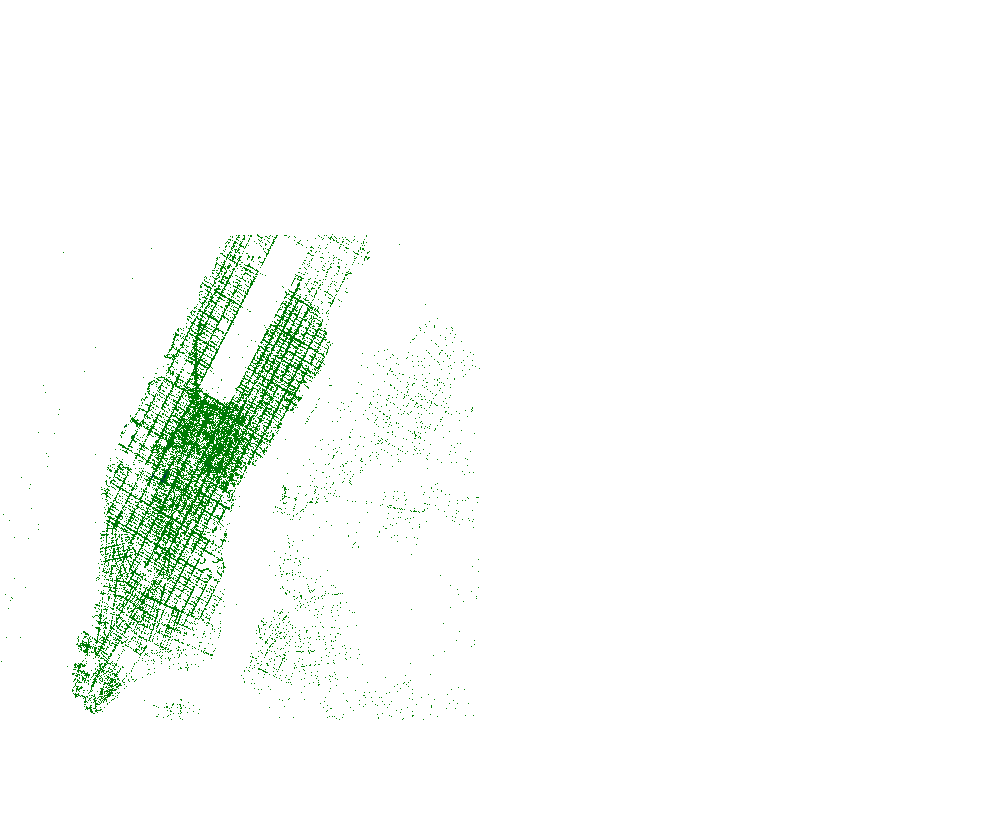

In [50]:
img
%time img

In [51]:
import numpy as np

# a histogram plotting function
def histogram(x, colors=None):
    hist,edges = np.histogram(x, bins=100)
    p = figure(y_axis_label="Pixels",
               tools='', height=130, outline_line_color=None,
               min_border=0, min_border_left=0, min_border_right=0,
               min_border_top=0, min_border_bottom=0)
    p.quad(top=hist[1:], bottom=0, left=edges[1:-1], right=edges[2:])
    print("min: {}, max: {}".format(np.min(x),np.max(x)))
    show(p)



In [52]:
histogram(agg.values)

min: 0, max: 60


min: 0.9715371900826446, max: 1.0


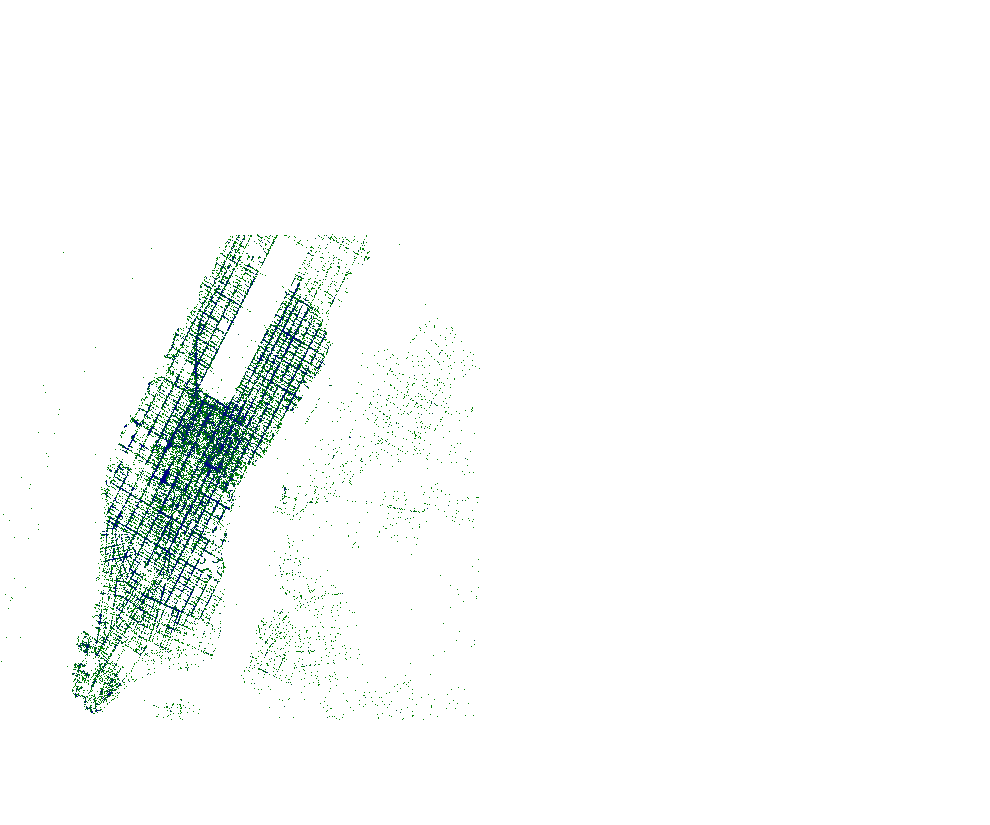

In [53]:
histogram(tf.eq_hist(agg.values))
    
tf.shade(agg, cmap=["green", 'darkblue'], how='eq_hist')

CPU times: user 37.5 ms, sys: 66 µs, total: 37.5 ms
Wall time: 36.5 ms


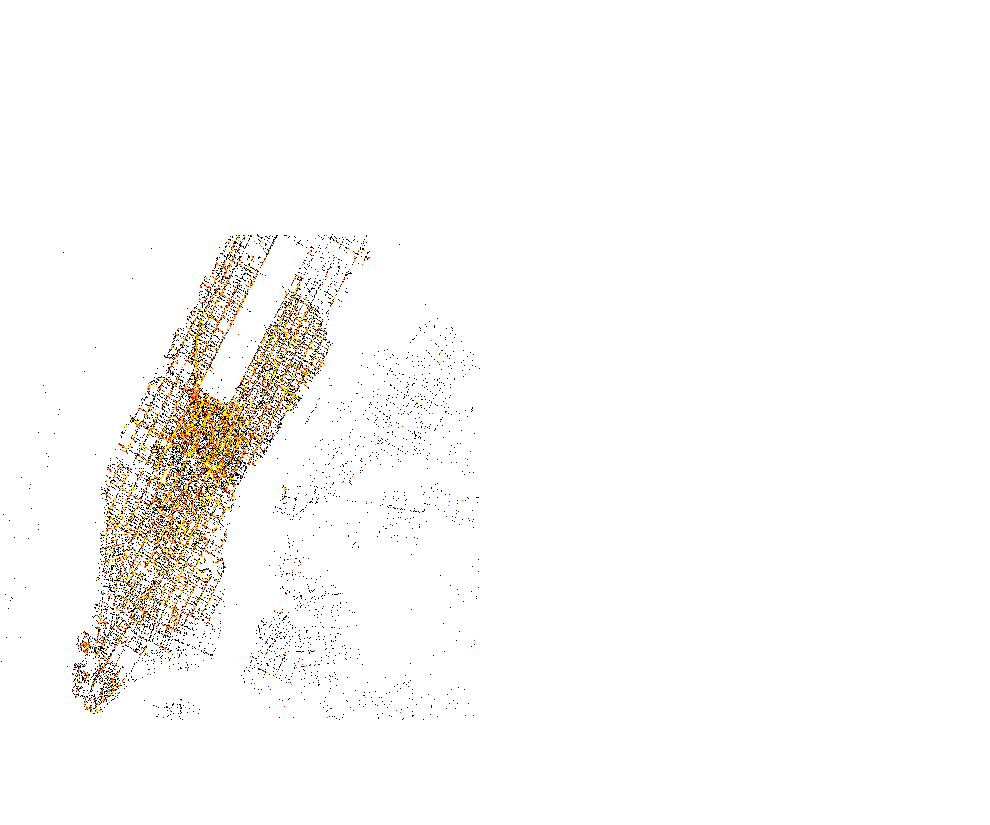

In [54]:
from datashader.bokeh_ext import InteractiveImage
from functools import partial
from datashader.utils import export_image
from datashader.colors import colormap_select, Hot, inferno

# cool trick (from the offical notebook to make function calls more elegant)
background = "black"
export = partial(export_image, export_path="export", background="black")
cm = partial(colormap_select, reverse=(background=="black"))

# this functions wraps the image creating process of datashader
def create_image(x_range, y_range, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(df4, 'dropoff_x', 'dropoff_y',  ds.count('passenger_count'))
    img = tf.shade(agg, cmap=Hot, how='eq_hist')
    return tf.dynspread(img, threshold=0.5, max_px=4)
%time create_image(x_range,y_range)

In [55]:
p = base_plot(background_fill_color=background)
InteractiveImage(p, create_image)

In [56]:
p = base_plot()
p.add_tile(STAMEN_TERRAIN)
InteractiveImage(p, create_image)


CPU times: user 80.9 ms, sys: 0 ns, total: 80.9 ms
Wall time: 79.8 ms


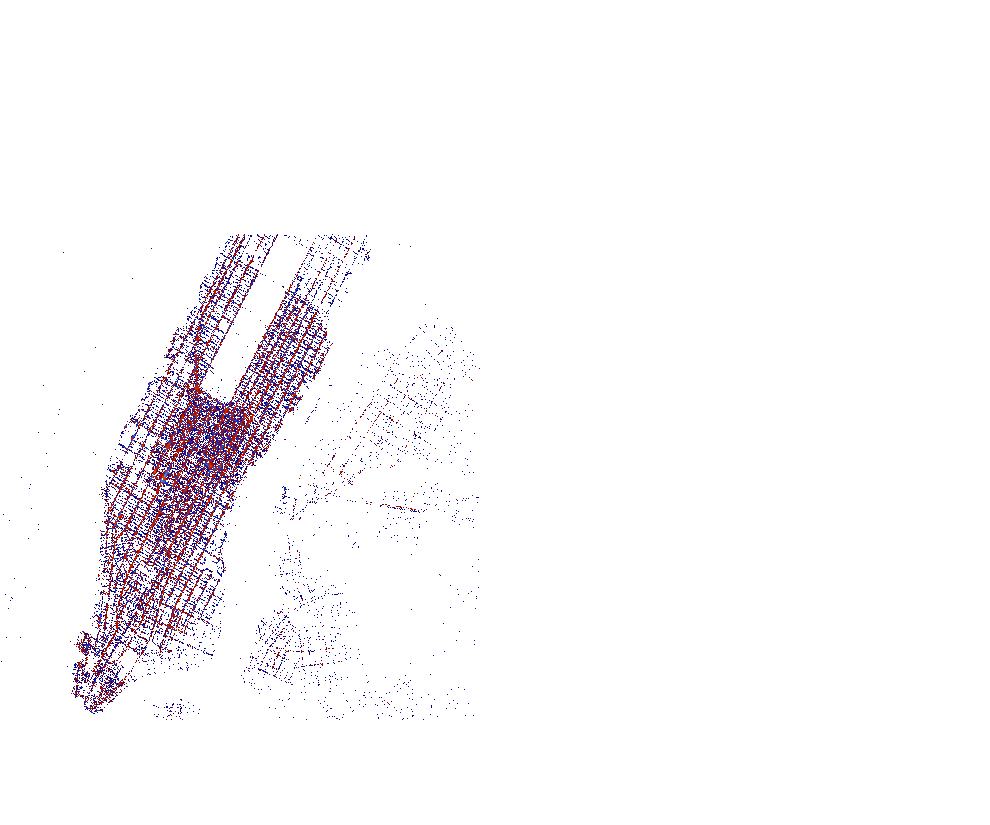

In [59]:
def merged_images(x_range, y_range, w=plot_width, h=plot_height, how='log'):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    picks = cvs.points(df4, 'pickup_x',  'pickup_y',  ds.count('passenger_count'))
    drops = cvs.points(df4, 'dropoff_x', 'dropoff_y', ds.count('passenger_count'))
    drops = drops.rename({'dropoff_x': 'x', 'dropoff_y': 'y'})
    picks = picks.rename({'pickup_x': 'x', 'pickup_y': 'y'})
    more_drops = tf.shade(drops.where(drops > picks), cmap=["darkblue", 'cornflowerblue'], how=how)
    more_picks = tf.shade(picks.where(picks > drops), cmap=["darkred", 'orangered'], how=how)
    img = tf.stack(more_picks, more_drops)
    return tf.dynspread(img, threshold=0.3, max_px=4)
%time merged_images(x_range,y_range)

In [60]:
p = base_plot(background_fill_color=background)
InteractiveImage(p, merged_images)

TypeError: merged_images() missing 2 required positional arguments: 'x_range' and 'y_range'